In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import math

In [2]:
# UN-DISTORTION_________________________________________________________________________________________________________
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)


def calibrate():
    """Calibrates the camera and returns camera matrix and distance coefficients"""
    global gray
    objp = np.zeros((6 * 9, 3), np.float32)
    objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

    objpoints = []  # 3d point in real world space
    imgpoints = []  # 2d points in image plane.

    images = glob.glob('./camera_cal/calibration*.jpg')

    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)

    cv2.destroyAllWindows()

    ret, cam_mtx, dist_coeff, rot_vectors, trans_vectors = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],
                                                                               None, None)
    return cam_mtx, dist_coeff

cam_mtx, dist_coeff = calibrate()

def undistorted(image):
    """returns the undistorted image un_dist after calibrating the camera"""
    un_dist = cv2.undistort(image, cam_mtx, dist_coeff, None, cam_mtx)
    return un_dist


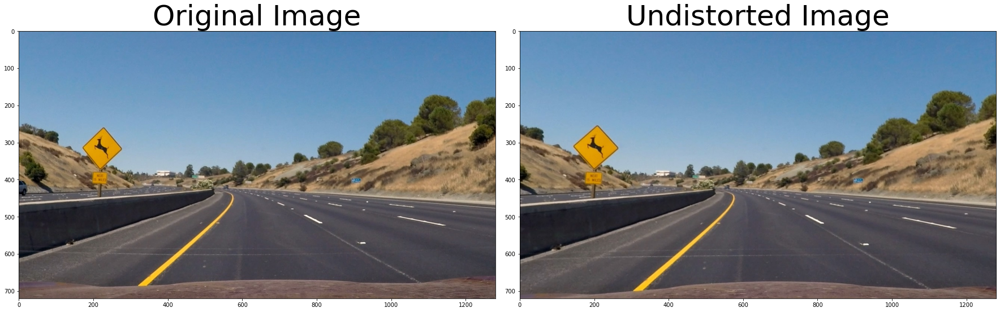

In [19]:
undistorted_test()

In [4]:
# CREATE ROI POINTS_____________________________________________________________________________________________________
def add_points(image, src_image_points):
    """Draw points on the image using src coordinates"""
    point_image = np.copy(image)
    color = [255, 0, 0]  # Red
    thickness = -1
    radius = 15
    x0, y0 = src_image_points[0]
    x1, y1 = src_image_points[1]
    x2, y2 = src_image_points[2]
    x3, y3 = src_image_points[3]
    cv2.circle(point_image, (x0, y0), radius, color, thickness)
    cv2.circle(point_image, (x1, y1), radius, color, thickness)
    cv2.circle(point_image, (x2, y2), radius, color, thickness)
    cv2.circle(point_image, (x3, y3), radius, color, thickness)
    return point_image


def add_lines(image, src_image_points):
    """Draw lines on the image using src coordinates"""
    line_image = np.copy(image)
    color = [255, 0, 0]  # Red
    thickness = 2
    x0, y0 = src_image_points[0]
    x1, y1 = src_image_points[1]
    x2, y2 = src_image_points[2]
    x3, y3 = src_image_points[3]
    cv2.line(line_image, (x0, y0), (x1, y1), color, thickness)
    cv2.line(line_image, (x1, y1), (x2, y2), color, thickness)
    cv2.line(line_image, (x2, y2), (x3, y3), color, thickness)
    cv2.line(line_image, (x3, y3), (x0, y0), color, thickness)
    return line_image


def origin_image_pts():
    """Returns points for the original image"""
    org_image_pts = np.float32([
        [210, 700],
        [570, 460],
        [705, 460],
        [1075, 700]
    ])
    return org_image_pts


def destination_image_points(image):
    """Returns points for the warped image"""
    h, w = image.shape[:2]
    dst_img_points = np.float32([
        [400, 720],
        [400, 0],
        [w - 400, 0],
        [w - 400, 720]
    ])
    return dst_img_points


In [5]:
# WARP-UNWARP___________________________________________________________________________________________________________
def image_warper(image):
    """Returns warped version of image"""
    h, w = image.shape[:2]
    dst_points = np.float32([
        [400, 720],
        [400, 0],
        [w - 400, 0],
        [w - 400, 720]
    ])
    src_points = np.float32([
        [210, 700],
        [570, 460],
        [705, 460],
        [1075, 700]
    ])
    image_size = (image.shape[1], image.shape[0])
    transform_matrix = cv2.getPerspectiveTransform(src=src_points, dst=dst_points)
    warped_image = cv2.warpPerspective(image, transform_matrix, image_size, flags=cv2.INTER_NEAREST)

    return warped_image


def image_unwarper(image):
    """Returns unwarped version of image"""
    h, w = image.shape[:2]
    dst = np.float32([
        [400, 720],
        [400, 0],
        [w - 400, 0],
        [w - 400, 720]
    ])
    src = np.float32([
        [210, 700],
        [570, 460],
        [705, 460],
        [1075, 700]
    ])
    image_size = (image.shape[1], image.shape[0])
    Minv = cv2.getPerspectiveTransform(dst, src)
    unwarped = cv2.warpPerspective(image, Minv, image_size, flags=cv2.INTER_NEAREST)

    return unwarped

<ipython-input-4-d0ef41835c5f>:12: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(point_image, (x0, y0), radius, color, thickness)
<ipython-input-4-d0ef41835c5f>:13: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(point_image, (x1, y1), radius, color, thickness)
<ipython-input-4-d0ef41835c5f>:14: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  cv2.circle(point_image, (x2, y2), radius, color, thickness)
<ipython-input-4-d0ef41835c5f>:15: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, 

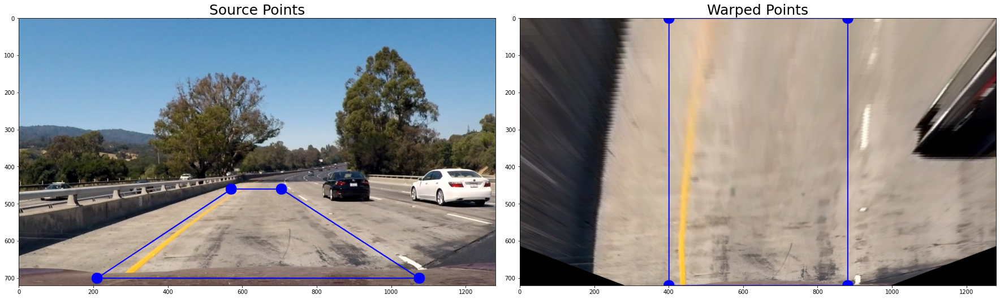

In [20]:
warp_test()

In [7]:
# EDGE-DETECTION________________________________________________________________________________________________________
def sobel_edge(image, sob_x=False, sob_y=False, threshold_low=25, threshold_high=200):
    """Returns sobel binary image after applying sobel x and/or y"""
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0)
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1)

    if sob_x:
        sobel_absolute = np.absolute(sobel_x)
        sobel_scaled = np.uint8(255 * sobel_absolute / np.max(sobel_absolute))
    elif sob_y:
        sobel_absolute = np.absolute(sobel_y)
        sobel_scaled = np.uint8(255 * sobel_absolute / np.max(sobel_absolute))
    else:
        sobel_magnitude = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
        sobel_scaled = np.uint8(255 * sobel_magnitude / np.max(sobel_magnitude))

    sobel_binary = np.zeros_like(sobel_scaled)
    sobel_binary[(sobel_scaled >= threshold_low) & (sobel_scaled <= threshold_high)] = 1

    return sobel_binary


def grayscale(image):
    """convert image to grayscale"""
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


def gaussian_blur(image, kernel_size=5):
    """apply gaussian blur on the image using a kernel of size = (kernel_size, kernel_size)"""
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)


def canny(image, threshold_low, threshold_high):
    """use canny edge detection with thresholds on the image"""
    return cv2.Canny(image, threshold_low, threshold_high)


def canny_edge(image, kernel_size=5, threshold_low=50, threshold_high=150):
    """Returns the canny image of the input image after thresholding"""
    gray_image = grayscale(image)
    gaussian_blur_image = gaussian_blur(gray_image, kernel_size=kernel_size)
    canny_image = canny(gaussian_blur_image, threshold_low=threshold_low, threshold_high=threshold_high)
    return canny_image

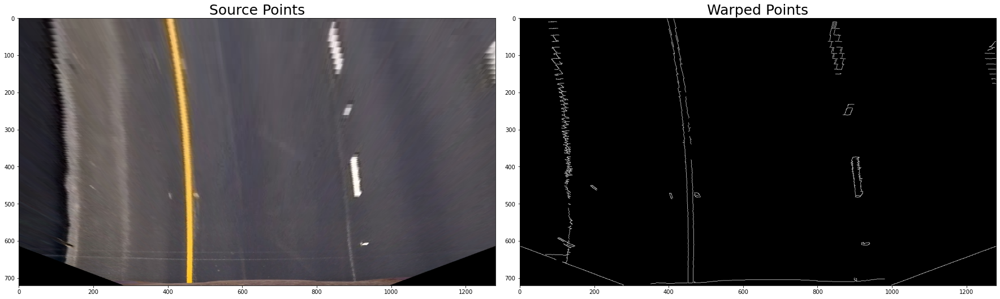

In [21]:
canny_test()

In [30]:
# COLOR SEPARATION______________________________________________________________________________________________________
def apply_threshold(channel, threshold_low, threshold_high):
    """Returns a binary """
    binary_output = np.zeros_like(channel)
    binary_output[(channel >= threshold_low) & (channel <= threshold_high)] = 1
    return binary_output


def noise_remover(image):
    """Returns the image without noise"""
    kernel = np.ones((5, 5), np.uint8)
    erosion_image = cv2.erode(image * 255, kernel, iterations=1)
    clean_image = cv2.dilate(erosion_image, kernel, iterations=1)
    return clean_image


def channel_thresholder(image, r=False, s=False, b=False, l=False,
                        threshold_low=0, threshold_high=0):
    """Thresholds the R channel of the BGR image, S channel of the HSL converted image, B channel of the LAB converted image,
       L channel of the LUV converted image depending of the Truth values of the r, s, b and l parameters respectively.
       Returns the binary output of the threshold applied image."""
    if r:
        bgr_image = np.copy(image)
        channel = bgr_image[:, :, 2]  # For a BGR format image
        return apply_threshold(channel=channel, threshold_low=threshold_low, threshold_high=threshold_high)
    if s:
        hls_image = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
        channel = hls_image[:, :, 2]
        return apply_threshold(channel=channel, threshold_low=threshold_low, threshold_high=threshold_high)
    if b:
        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        channel = lab_image[:, :, 2]
        return apply_threshold(channel=channel, threshold_low=threshold_low, threshold_high=threshold_high)
    if l:
        luv_image = cv2.cvtColor(image, cv2.COLOR_BGR2LUV)
        channel = luv_image[:, :, 0]
        return apply_threshold(channel=channel, threshold_low=threshold_low, threshold_high=threshold_high)
    return


def binary_combiner(image, sobel_flag=False, canny_flag=False, clean_flag=False, show_images=False,
                    sobel_threshold_low=35, sobel_threshold_high=50,
                    canny_threshold_low=50, canny_threshold_high=150,
                    r_threshold_low=225, r_threshold_high=255,
                    s_threshold_low=220, s_threshold_high=250,
                    b_threshold_low=175, b_threshold_high=255,
                    l_threshold_low=215, l_threshold_high=255):
    """Combines the binary images and returns combined_binary_image"""
    global edge_image
    working_image = np.copy(image)

    undistorted_image = undistorted(working_image)
    warped_image = image_warper(undistorted_image)
    r_binary = channel_thresholder(warped_image, r=True, threshold_low=r_threshold_low, threshold_high=r_threshold_high)
    s_binary = channel_thresholder(warped_image, s=True, threshold_low=s_threshold_low, threshold_high=s_threshold_high)
    b_binary = channel_thresholder(warped_image, b=True, threshold_low=b_threshold_low, threshold_high=b_threshold_high)
    l_binary = channel_thresholder(warped_image, l=True, threshold_low=l_threshold_low, threshold_high=l_threshold_high)

    if canny_flag:
        edge_image = canny_edge(image=warped_image,
                                threshold_low=canny_threshold_low,
                                threshold_high=canny_threshold_high)
    if sobel_flag:
        edge_image = sobel_edge(image=warped_image,
                                threshold_low=sobel_threshold_low,
                                threshold_high=sobel_threshold_high)

    combined_binary = np.zeros_like(r_binary)
    combined_binary[(r_binary == 1) | (s_binary == 1) | (b_binary == 1) | (l_binary == 1) | (edge_image == 1)] = 1
    if show_images:
        f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16, 7))
        f.tight_layout()
        
        ax1.set_title('r', fontsize=10)
        ax1.axis('off')
        ax1.imshow(r_binary, cmap='gray')
        
        ax2.set_title('s', fontsize=15)
        ax2.axis('off')
        ax2.imshow(s_binary, cmap='gray')
        
        ax3.set_title('b', fontsize=15)
        ax3.axis('off')
        ax3.imshow(b_binary, cmap='gray')

        ax4.set_title('l', fontsize=15)
        ax4.axis('off')
        ax4.imshow(l_binary, cmap='gray')

        ax5.set_title('sobel', fontsize=15)
        ax5.axis('off')
        ax5.imshow(edge_image, cmap='gray')

    if clean_flag:
        clean_image = noise_remover(combined_binary * 255)
        return clean_image
    return combined_binary

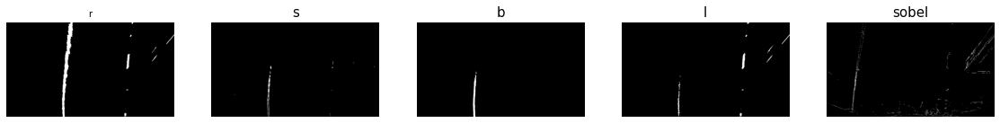

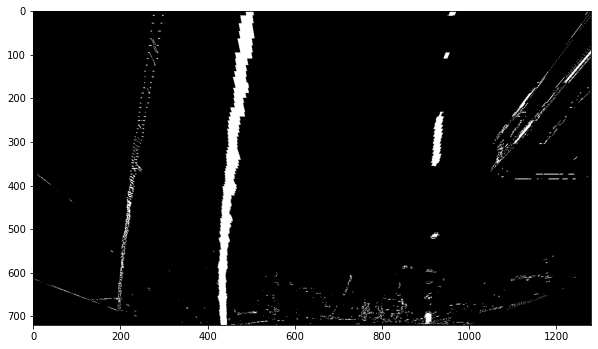

In [32]:
binary_combiner_test()

In [11]:
# FINDING LANES_________________________________________________________________________________________________________
def line_fit_calculator(image):
    """Calculates and returns the line fits for the left and the right lane lines and the output image"""
    n_windows = 9
    margin = 50
    min_pix = 50

    histogram = np.sum(image[image.shape[0] // 2:, :], axis=0)

    output_image = np.dstack((image, image, image)) * 255

    mid_point = int(histogram.shape[0] / 2)
    left_base = np.argmax(histogram[:mid_point])
    right_base = np.argmax(histogram[mid_point:]) + mid_point

    window_height = int(image.shape[0] / n_windows)

    non_zero = image.nonzero()
    non_zero_y = np.array(non_zero[0])
    non_zero_x = np.array(non_zero[1])

    left_x_current = left_base
    right_x_current = right_base

    left_lane_indices = []
    right_lane_indices = []

    for window in range(n_windows):
        window_y_low = image.shape[0] - (window + 1) * window_height
        window_y_high = image.shape[0] - window * window_height

        window_x_left_l = left_x_current - margin
        window_x_left_r = left_x_current + margin
        window_x_right_l = right_x_current - margin
        window_x_right_r = right_x_current + margin

        cv2.rectangle(output_image, (window_x_left_l, window_y_low), (window_x_left_r, window_y_high), (0, 255, 0), 2)
        cv2.rectangle(output_image, (window_x_right_l, window_y_low), (window_x_right_r, window_y_high), (0, 255, 0), 2)

        valid_left_indices = ((non_zero_y >= window_y_low) & (non_zero_y <= window_y_high) &
                              (non_zero_x >= window_x_left_l) & (non_zero_x <= window_x_left_r)).nonzero()[0]
        valid_right_indices = ((non_zero_y >= window_y_low) & (non_zero_y <= window_y_high) &
                               (non_zero_x >= window_x_right_l) & (non_zero_x <= window_x_right_r)).nonzero()[0]

        left_lane_indices.append(valid_left_indices)
        right_lane_indices.append(valid_right_indices)

        if len(valid_left_indices) > min_pix:
            left_x_current = int(np.mean(non_zero_x[valid_left_indices]))
        if len(valid_right_indices) > min_pix:
            right_x_current = int(np.mean(non_zero_x[valid_right_indices]))

    left_lane_indices = np.concatenate(left_lane_indices)
    right_lane_indices = np.concatenate(right_lane_indices)

    left_x = non_zero_x[left_lane_indices]
    left_y = non_zero_y[left_lane_indices]
    right_x = non_zero_x[right_lane_indices]
    right_y = non_zero_y[right_lane_indices]

    left_line_fit = np.polyfit(left_y, left_x, 2)
    right_line_fit = np.polyfit(right_y, right_x, 2)

    output_image[non_zero_y[left_lane_indices], non_zero_x[left_lane_indices]] = [255, 0, 0]
    output_image[non_zero_y[right_lane_indices], non_zero_x[right_lane_indices]] = [0, 0, 255]

    return left_line_fit, right_line_fit, output_image


class Line:
    """Class for keeping track of a few previous lane line curves"""

    def __init__(self):
        """Initialize variables"""
        self.detected_in_prev = False
        self.best_fit_px = None
        self.latest_fit_px = None
        self.previous_fits_px = []
        self.coeff_diff = np.array([0, 0, 0], dtype='float')

    def calc_best_fit(self):
        """Averages the latest 5 line fits"""
        self.previous_fits_px.append(self.latest_fit_px)

        if len(self.previous_fits_px) > 5:
            self.previous_fits_px = self.previous_fits_px[1:]

        self.best_fit_px = np.average(self.previous_fits_px, axis=0)
        return

    def check_diff(self):
        """Checks whether the difference between new and latest fit px"""
        if self.coeff_diff[0] > 0.001:
            return True
        if self.coeff_diff[1] > 0.25:
            return True
        if self.coeff_diff[2] > 1000.:
            return True
        return False

    def add_new_fit(self, new_fit_px):
        """Adds a new fit to the class"""
        if np.array(self.latest_fit_px).all() is None and self.previous_fits_px == []:
            self.detected_in_prev = True
            self.latest_fit_px = new_fit_px
            self.calc_best_fit()
        else:
            self.coeff_diff = np.abs(new_fit_px - self.latest_fit_px)
            if self.check_diff():
                print("Found a fit diff that was too big")
                print(self.coeff_diff)
                self.detected_in_prev = False
                return
            self.detected_in_prev = True
            self.latest_fit_px = new_fit_px
            self.calc_best_fit()
            return


def from_prev_line_fit_calculator(image, left_line=Line(), right_line=Line()):
    """Returns the left and right lane line fit along with the weighted image output"""

    left_fit = left_line.best_fit_px
    right_fit = right_line.best_fit_px

    margin = 100

    non_zero = image.nonzero()
    non_zero_y = np.array(non_zero[0])
    non_zero_x = np.array(non_zero[1])

    left_low = (left_fit[0] * (non_zero_y ** 2)) + (left_fit[1] * non_zero_y) + left_fit[2] - margin
    left_high = (left_fit[0] * (non_zero_y ** 2)) + (left_fit[1] * non_zero_y) + left_fit[2] + margin
    right_low = (right_fit[0] * (non_zero_y ** 2)) + (right_fit[1] * non_zero_y) + right_fit[2] - margin
    right_high = (right_fit[0] * (non_zero_y ** 2)) + (right_fit[1] * non_zero_y) + right_fit[2] + margin
    left_lane_indices = ((non_zero_x > left_low) & (non_zero_x < left_high))
    right_lane_indices = ((non_zero_x > right_low) & (non_zero_x < right_high))

    left_x = non_zero_x[left_lane_indices]
    left_y = non_zero_y[left_lane_indices]
    right_x = non_zero_x[right_lane_indices]
    right_y = non_zero_y[right_lane_indices]

    left_line_fit = np.polyfit(left_y, left_x, 2)
    right_line_fit = np.polyfit(right_y, right_x, 2)
    plot_y = np.linspace(0, image.shape[0] - 1, image.shape[0])
    left_fit_x = left_line_fit[0] * plot_y ** 2 + left_line_fit[1] * plot_y + left_line_fit[2]
    right_fit_x = right_line_fit[0] * plot_y ** 2 + right_line_fit[1] * plot_y + right_line_fit[2]

    output_image = np.dstack((image, image, image)) * 255
    window_image = np.zeros_like(output_image)

    output_image[non_zero_y[left_lane_indices], non_zero_x[left_lane_indices]] = [255, 0, 0]
    output_image[non_zero_y[right_lane_indices], non_zero_x[right_lane_indices]] = [0, 0, 255]

    left_line_window1 = np.array([np.transpose(np.vstack([left_fit_x - margin, plot_y]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fit_x + margin, plot_y])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fit_x - margin, plot_y]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fit_x + margin, plot_y])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    cv2.fillPoly(window_image, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_image, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(output_image, 1, window_image, 0.3, 0)

    return left_line_fit, right_line_fit, result

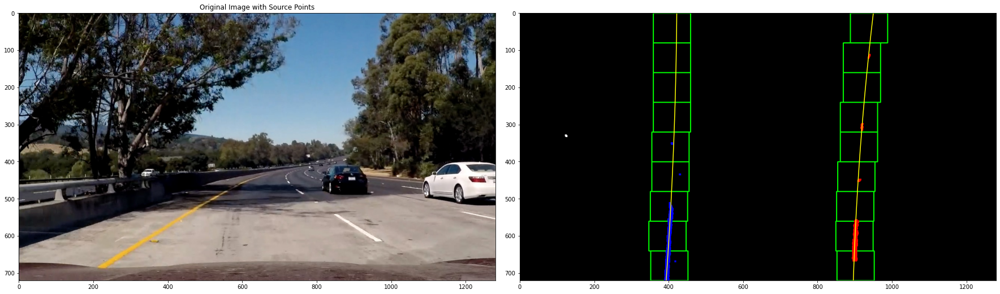

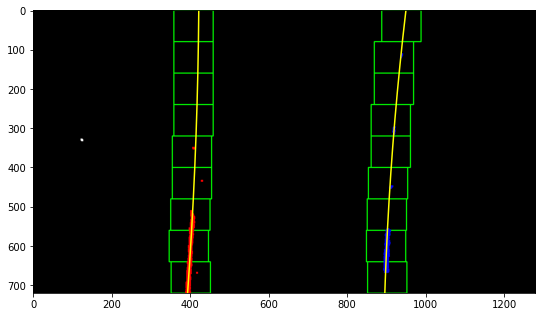

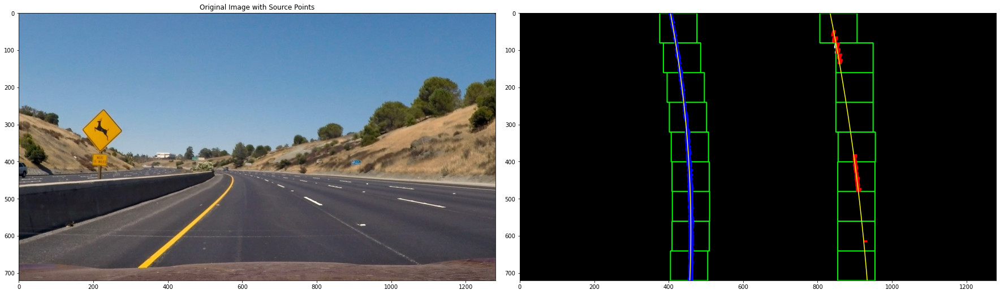

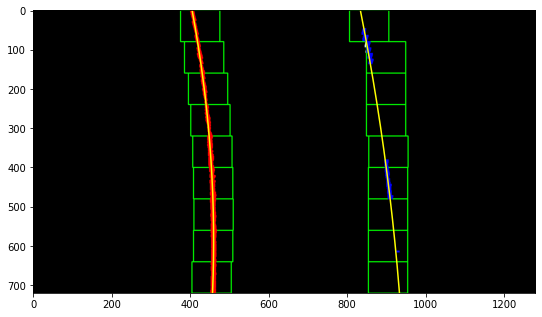

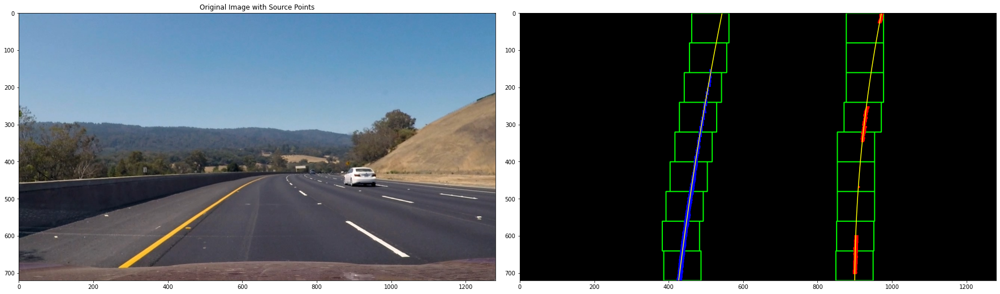

...

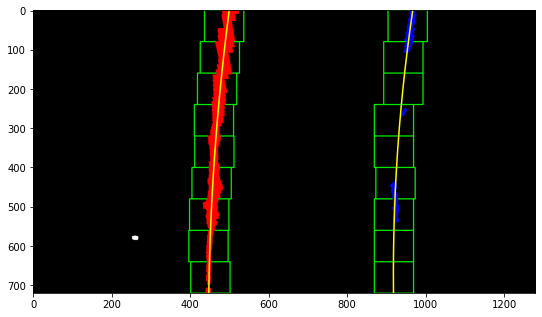

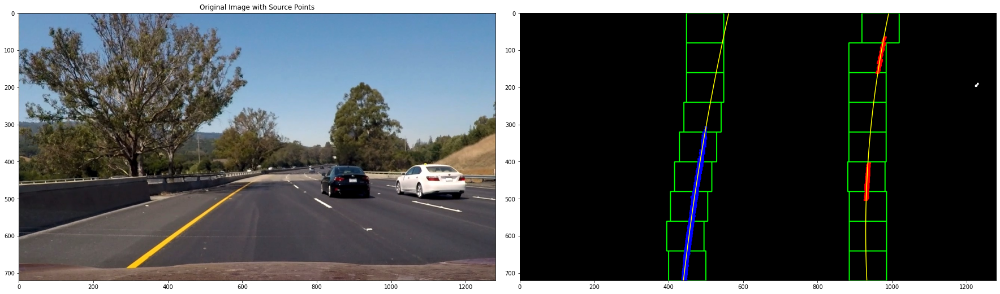

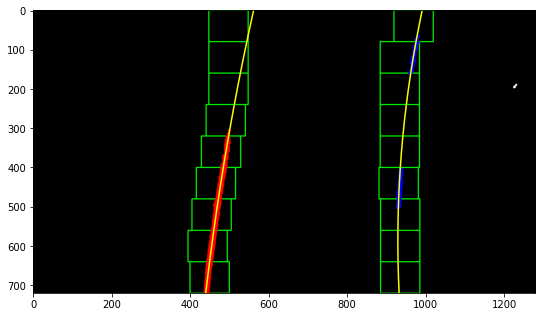

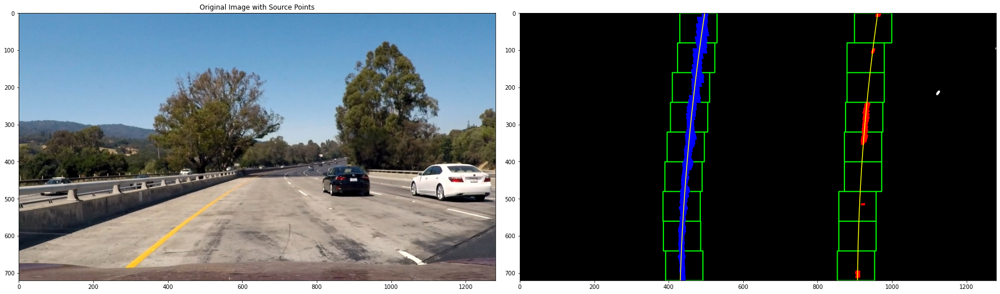

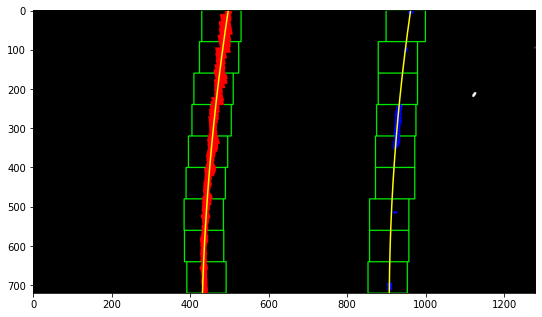

In [35]:
line_fit_calculator_test()

In [13]:
# FINDING STEERING ANGLE________________________________________________________________________________________________
def calc_steer_angle(left_line=Line(), right_line=Line()):
    """Returns the steering angle to be used to correct the path of the car"""
    y = 720/2
    left_point = left_line.best_fit_px[0] * (y ** 2) + left_line.best_fit_px[1] * y + left_line.best_fit_px[2]
    right_point = right_line.best_fit_px[0] * (y ** 2) + right_line.best_fit_px[1] * y + right_line.best_fit_px[2]
    mid_point_lane = int((right_point - left_point) / 2) + left_point

    y = 720
    left_point = left_line.best_fit_px[0] * (y ** 2) + left_line.best_fit_px[1] * y + left_line.best_fit_px[2]
    right_point = right_line.best_fit_px[0] * (y ** 2) + right_line.best_fit_px[1] * y + right_line.best_fit_px[2]
    mid_point_image = int((right_point - left_point) / 2) + left_point

    opposite = mid_point_lane - mid_point_image
    base = 720 - 700
    steer_angle = math.atan(abs(opposite / base))

    if opposite > 0:
        direction_flag = 'right'
        return steer_angle, direction_flag
    elif opposite < 0:
        direction_flag = 'left'
        return steer_angle, direction_flag
    else:
        direction_flag = 'straight'
        return steer_angle, direction_flag

In [14]:
# FORM FINAL IMAGE______________________________________________________________________________________________________
def final_image_creator(image, binary_warped_image, left_line=Line(), right_line=Line(), show_flag=False):
    """Returns the unwarped version of binary_warped_image with lane lines plotted on it"""
    left_fit = left_line.best_fit_px
    right_fit = right_line.best_fit_px

    warp_zero = np.zeros_like(binary_warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    plot_y = np.linspace(0, binary_warped_image.shape[0] - 1, binary_warped_image.shape[0])
    left_fit_x = left_fit[0] * plot_y ** 2 + left_fit[1] * plot_y + left_fit[2]
    right_fit_x = right_fit[0] * plot_y ** 2 + right_fit[1] * plot_y + right_fit[2]

    pts_left = np.array([np.transpose(np.vstack([left_fit_x, plot_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fit_x, plot_y])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255, 0, 255), thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0, 255, 255), thickness=20)

    new_warp = image_unwarper(color_warp)

    result = cv2.addWeighted(image, 1, new_warp, 0.5, 0)

    if show_flag:
        plt.figure(figsize=(9, 9))
        plt.imshow(color_warp)

        plt.figure(figsize=(9, 9))
        plt.imshow(result)

    return result


def add_steer_text(image, steer_angle, direction_flag):
    """Adds inormation on steering angle and direction to the image to be returned"""
    font = cv2.FONT_HERSHEY_COMPLEX

    text = '{:03.2f}'.format(abs(steer_angle)) + ' degrees to the ' + direction_flag
    cv2.putText(image, text, (50, 175), font, 1.5, (51, 153, 255), 2, cv2.LINE_AA)

    return image

In [15]:
# COMBINE ALL FUNCTIONS_________________________________________________________________________________________________
def final_pipe(image, left_line=Line(), right_line=Line()):
    """Returns the final image after performing undistortion, warping, binary thresholding, lane detection and
    text addition"""
    binary_warped_image = binary_combiner(image, sobel_flag=True)

    if left_line.detected_in_prev and right_line.detected_in_prev:
        left_fit, right_fit, output_img = from_prev_line_fit_calculator(binary_warped_image, left_line, right_line)
    else:
        left_fit, right_fit, output_img = line_fit_calculator(binary_warped_image)

    left_line.add_new_fit(left_fit)
    right_line.add_new_fit(right_fit)

    steer_angle, direction_flag = calc_steer_angle(left_line, right_line)

    final_image = final_image_creator(image, binary_warped_image, left_line, right_line)

    result = add_steer_text(final_image, steer_angle, direction_flag)

    return result


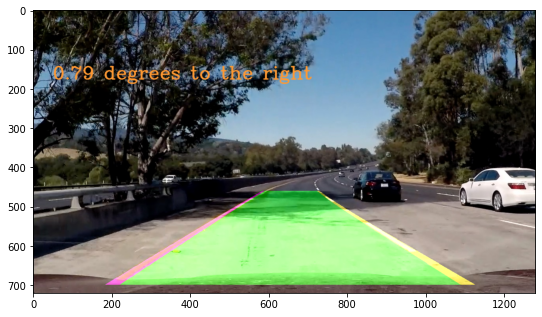

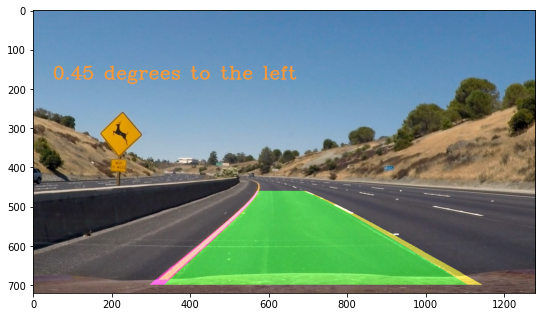

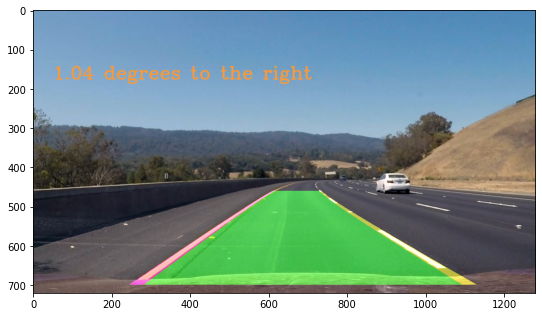

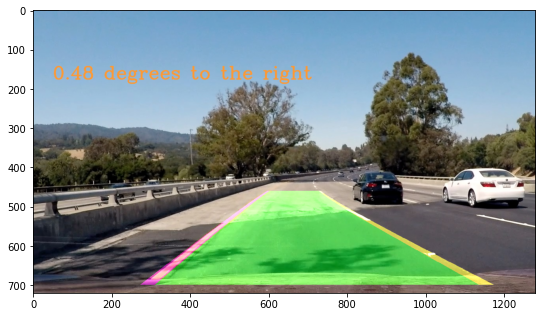

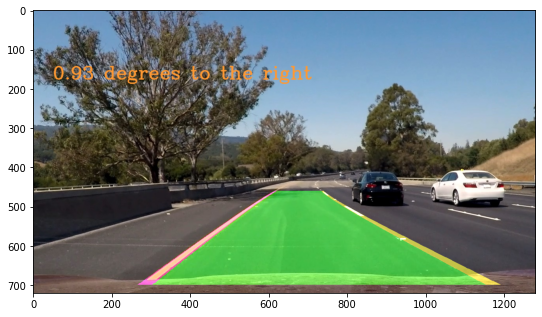

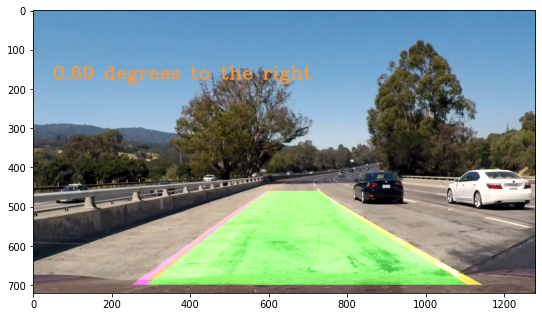

In [36]:
final_pipe_test()

In [39]:
# VIDEO PROCESSING______________________________________________________________________________________________________
def frame_capture(path='test_video/test_video_1.mp4'):
    """Captures and saves the frames from the video specified at path"""
    vid_obj = cv2.VideoCapture(path)

    count = 0

    success = 1

    while success:
        success, image = vid_obj.read()
        if count < 10:
            cv2.imwrite("video_frames/frame_00%d.jpg" % count, image)
        elif count < 100:
            cv2.imwrite("video_frames/frame_0%d.jpg" % count, image)
        else:
            cv2.imwrite("video_frames/frame_%d.jpg" % count, image)
        count += 1


def process_frames():
    """Processes the frames captured and creates a final image"""
    image_list = glob.glob('video_frames/frame*.jpg')
    image_list.sort()
#     print(image_list)
    for i, fname in enumerate(image_list):
        img = cv2.imread(fname)
        print('processing image %d' % i)
        right_line = Line()
        left_line = Line()
        result = final_pipe(img, left_line, right_line)
        if i < 10:
            cv2.imwrite("final_video_frames/processed_frame_00%d.jpg" % i, result)
        elif i < 100:
            cv2.imwrite("final_video_frames/processed_frame_0%d.jpg" % i, result)
        elif i >= 100:
            cv2.imwrite("final_video_frames/processed_frame_%d.jpg" % i, result)


def make_video():
    """Combines the images and makes a video stores in the root folder of the project"""
    final_image_list = glob.glob('final_video_frames/processed_frame_*.jpg')
    final_image_list.sort()
#     print(final_image_list)

    image_array = []
    for i, image_path in enumerate(final_image_list):
        print('appending image %d' % i)
        image = cv2.imread(image_path)
        height, width, layers = image.shape
        size = (width, height)
        image_array.append(image)

    out = cv2.VideoWriter('project.avi', cv2.VideoWriter_fourcc(*'DIVX'), 25, size)

    for i in range(len(image_array)):
        out.write(image_array[i])
    out.release()


In [40]:
# frame_capture()
process_frames()
make_video()

processing image 0
processing image 1
processing image 2
processing image 3
processing image 4
processing image 5
processing image 6
processing image 7
processing image 8
processing image 9
processing image 10
processing image 11
processing image 12
processing image 13
processing image 14
processing image 15
processing image 16
processing image 17
processing image 18
processing image 19
processing image 20
processing image 21
processing image 22
processing image 23
processing image 24
processing image 25
processing image 26
processing image 27
processing image 28
processing image 29
processing image 30
processing image 31
processing image 32
processing image 33
processing image 34
processing image 35
processing image 36
processing image 37
processing image 38
processing image 39
processing image 40
processing image 41
processing image 42
processing image 43
processing image 44
processing image 45
processing image 46
processing image 47
processing image 48
processing image 49
processing

processing image 397
processing image 398
processing image 399
processing image 400
processing image 401
processing image 402
processing image 403
processing image 404
processing image 405
processing image 406
processing image 407
processing image 408
processing image 409
processing image 410
processing image 411
processing image 412
processing image 413
processing image 414
processing image 415
processing image 416
processing image 417
processing image 418
processing image 419
processing image 420
processing image 421
processing image 422
processing image 423
processing image 424
processing image 425
processing image 426
processing image 427
processing image 428
processing image 429
processing image 430
processing image 431
processing image 432
processing image 433
processing image 434
processing image 435
processing image 436
processing image 437
processing image 438
processing image 439
processing image 440
processing image 441
processing image 442
processing image 443
processing im

appending image 225
appending image 226
appending image 227
appending image 228
appending image 229
appending image 230
appending image 231
appending image 232
appending image 233
appending image 234
appending image 235
appending image 236
appending image 237
appending image 238
appending image 239
appending image 240
appending image 241
appending image 242
appending image 243
appending image 244
appending image 245
appending image 246
appending image 247
appending image 248
appending image 249
appending image 250
appending image 251
appending image 252
appending image 253
appending image 254
appending image 255
appending image 256
appending image 257
appending image 258
appending image 259
appending image 260
appending image 261
appending image 262
appending image 263
appending image 264
appending image 265
appending image 266
appending image 267
appending image 268
appending image 269
appending image 270
appending image 271
appending image 272
appending image 273
appending image 274


In [34]:
# TEST FUNCTIONS________________________________________________________________________________________________________
def undistorted_test():
    """Test function for undistortion of image"""
    fname = './test_images/test2.jpg'
    # fname = './camera_cal/calibration1.jpg'
    img = cv2.imread(fname)

    undistorted_image = undistorted(image=img)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


def warp_test():
    """Test function for image_warper"""
    images = glob.glob('./test_images/test1.jpg')

    for i, fname in enumerate(images):
        image = cv2.imread(fname)
        src_points = origin_image_pts()
        dst_points = destination_image_points(image)

        undist_image = undistorted(image)

        warped_image = image_warper(undist_image)

        src_points_img = add_points(image, src_points)
        src_points_img = add_lines(src_points_img, src_points)
        dst_points_warped = add_points(warped_image, dst_points)
        dst_points_warped = add_lines(dst_points_warped, dst_points)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(src_points_img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Source Points', fontsize=25)
        ax2.imshow(cv2.cvtColor(dst_points_warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Warped Points', fontsize=25)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


def canny_test():
    """Test function for canny"""
    image = cv2.imread('./test_images/test2.jpg')
    warped_image = image_warper(image=image)
    canny_image = canny_edge(warped_image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Source Points', fontsize=25)
    ax2.imshow(cv2.cvtColor(canny_image, cv2.COLOR_BGR2RGB))
    ax2.set_title('Warped Points', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    


def binary_combiner_test():
    """Test function for binary_combiner"""
    img = cv2.imread('./test_images/test1.jpg')

    combined_binary = binary_combiner(image=img, sobel_flag=True, show_images=True)
    plt.figure(figsize=(10, 10))
    plt.imshow(combined_binary, cmap='gray')


def line_fit_calculator_test():
    images = glob.glob('./test_images/test*.jpg')

    # Loop through each image and send it to the pipeline
    for fname in images:
        img = cv2.imread(fname)
        img_og = np.copy(img)

        # Run this through our binary pipeline
        combined_binary = binary_combiner(img_og, sobel_flag=True, clean_flag=True)

        # Run the warped, binary image from the pipeline through the fitter
        left_fit, right_fit, out_img = line_fit_calculator(combined_binary)

        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image with Source Points')

        # Generate x and y values for plotting
        plot_y = np.linspace(0, combined_binary.shape[0] - 1, combined_binary.shape[0])
        left_fit_x = left_fit[0] * plot_y ** 2 + left_fit[1] * plot_y + left_fit[2]
        right_fit_x = right_fit[0] * plot_y ** 2 + right_fit[1] * plot_y + right_fit[2]

        ax2.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
        ax2.plot(left_fit_x, plot_y, color='yellow')
        ax2.plot(right_fit_x, plot_y, color='yellow')

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

        plt.figure(figsize=(9, 9))
        plt.imshow(out_img)
        plt.plot(left_fit_x, plot_y, color='yellow')
        plt.plot(right_fit_x, plot_y, color='yellow')


def line_fit_test():
    """Test function for lane line fit functions"""
    image_list = ['./test_images/test6.jpg', './test_images/test4.jpg', './test_images/test5.jpg']
    left_line = Line()
    right_line = Line()

    for i, fname in enumerate(image_list):
        image = cv2.imread(fname)
        working_image = np.copy(image)

        binary_warped_image = binary_combiner(working_image, sobel_flag=True)

        if i == 0:
            left_fit, right_fit, output_image = line_fit_calculator(binary_warped_image)
            # print(left_fit, right_fit, left_line.best_fit_px, right_line.best_fit_px)
            left_line.add_new_fit(left_fit)
            right_line.add_new_fit(right_fit)

            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
            f.tight_layout()
            ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax1.set_title('Original Image with Source Points')

            ax2.imshow(binary_warped_image, cmap='gray')
            ax2.set_title('Warped Perspective')

            ploty = np.linspace(0, binary_warped_image.shape[0] - 1, binary_warped_image.shape[0])
            print(ploty)
            left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
            right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

            ax3.imshow(output_image)
            ax3.plot(left_fitx, ploty, color='yellow')
            ax3.plot(right_fitx, ploty, color='yellow')

            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

        else:
            left_fit, right_fit, output_image = from_prev_line_fit_calculator(binary_warped_image, left_line,
                                                                              right_line)
            # print(left_fit, right_fit, left_line.best_fit_px, right_line.best_fit_px)
            left_line.add_new_fit(left_fit)
            right_line.add_new_fit(right_fit)

            ploty = np.linspace(0, binary_warped_image.shape[0] - 1, binary_warped_image.shape[0])
            left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
            right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
            f.tight_layout()
            ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax1.set_title('Original Image with Source Points')

            ax2.imshow(binary_warped_image, cmap='gray')
            ax2.set_title('Warped Perspective')

            ax3.imshow(output_image)
            ax3.plot(left_fitx, ploty, color='yellow')
            ax3.plot(right_fitx, ploty, color='yellow')

            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


def final_pipe_test():
    """Test function for the final pipeline"""
    images = glob.glob('./test_images/*.jpg')
    for fname in images:
        img = cv2.imread(fname)
        right_line = Line()
        left_line = Line()
        result = final_pipe(img, left_line, right_line)
        result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(9, 9))
        plt.imshow(result)
